In [2]:
import pandas as pd
from rdkit import Chem
import numpy as np
from rdkit.Chem.Scaffolds.MurckoScaffold import MurckoScaffoldSmiles, MakeScaffoldGeneric
from collections import defaultdict

import matplotlib.pyplot as plt
import seaborn as sns
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw
from rdkit import Chem
from rdkit import DataStructs
from rdkit.Chem import AllChem
from sklearn.manifold import TSNE

from glob import glob
import os

import mplcursors
from io import BytesIO
import base64
from PIL import Image

import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import Draw
from io import BytesIO
import base64
from sklearn.manifold import TSNE
import plotly.graph_objects as go


# Fucntions for analyzing

In [3]:
def img_molecules(same_active, name):
    smiles_list = same_active.smiles.tolist()
    img_size=(400, 200)
    dpi=500
    
    molecules = [Chem.MolFromSmiles(smiles) for smiles in smiles_list]

    if len(molecules) > 5:
        mols_per_row = 5
    else:
        mols_per_row = len(molecules)
    
    IPythonConsole.drawOptions.drawMolsSameScale=False
    # Nastavení kvalitnějšího vykreslení
    img = Draw.MolsToGridImage(
        molecules, 
        molsPerRow=mols_per_row, 
        subImgSize=img_size, 
        #legends = same_active.smiles.tolist(),
    
        useSVG=False,
        returnPNG=False# SVG zajistí ostřejší obrázky
    )

    same_active.to_csv(f'analyze_metrics/{name}.csv', index = False)
    img.save(f'analyze_metrics/img_analyze/{name}.png')

In [4]:
import pandas as pd
from collections import defaultdict

def analyze_generator_data_all_splits(generator_list: list, base_path: str = '../../cluster/'):
    """
    Zpracuje scaffold a fingerprint aktivitu pro daný generátor a oba splity (dis/sim).
    
    Parameters:
        generator_name (str): Název generátoru (např. 'DrugEx')
        base_path (str): Cesta k datům

    Returns:
        pd.DataFrame: Shrnutí počtu aktivit průměrovaných přes clustery
    """
    scaffold = 'csk'
    splits = ['dis', 'sim']
    all_results = []
    summary_records = []

    for generator_name in generator_list:
        print("GENERATOR: ", generator_name)
        for split in splits:
            split_stats = defaultdict(list)
    
            for number in range(5):
                
                                # Načtení dat
               scaf_df = pd.read_csv(f'{base_path}res_scaf/{scaffold}/{generator_name}/scaf_of_output_set_cluster_{number}_{split}_{generator_name}_with_smiles.csv')
               fp_df = pd.read_csv(f'{base_path}results/{generator_name}/phfp_of_output_set_cluster_{number}_{split}_{generator_name}_with_smiles.csv')
               active_scaf_df = pd.read_csv(f'{base_path}res_scaf/{scaffold}/{generator_name}/scaf_of_recall_set_cluster_{number}_{split}_{generator_name}_with_smiles.csv')
               active_fp_df = pd.read_csv(f'{base_path}results/{generator_name}/phfp_of_recall_set_cluster_{number}_{split}_{generator_name}_with_smiles.csv')
               # Odstranění duplicit
               scaf_df = scaf_df.drop_duplicates(subset='smiles', keep='first')
               fp_df = fp_df.drop_duplicates(subset='smiles', keep='first')
               # Merge
               merged_df = scaf_df.merge(fp_df, on='smiles')
               active_scaffolds = set(active_scaf_df['scaf'])
               active_fps = set(active_fp_df['fp'])
               # Označení aktivních scaffoldů a fingerprintů
               merged_df['active_scaf'] = merged_df['scaf'].apply(lambda x: 1 if x in active_scaffolds else 0)
               merged_df['active_fp'] = merged_df['fp'].apply(lambda x: 1 if x in active_fps else 0)
               same_active = merged_df[(merged_df.active_scaf == 1) & (merged_df.active_fp == 1)]
               if len(same_active) > 0:
                   img_molecules(same_active, f'both_active_{generator_name}_{scaffold}_{split}_{number}')

                
               # Kategorizace
               def categorize(row):
                   if row['active_scaf'] == 1 and row['active_fp'] == 1:
                       return 'both_active'
                   elif row['active_scaf'] == 1:
                       return 'only_scaf'
                   elif row['active_fp'] == 1:
                       return 'only_fp'
                   else:
                       return 'non_active'
               
               merged_df['activity_category'] = merged_df.apply(categorize, axis=1)
               # Počty dle kategorií
               stats = merged_df['activity_category'].value_counts()
               for category in ['both_active', 'only_scaf', 'only_fp']:
                   split_stats[category].append(stats.get(category, 0))
    
                   summary_records.append({
                                'generator': generator_name,
                                'split': split,
                                'cluster': number,
                                'category': category,
                                'count': stats.get(category, 0)
                            })
    
               merged_df[['smiles', 'active_scaf', 'active_fp', 'activity_category']].to_csv(f'analyze_metrics/merged_df_{generator_name}_{scaffold}_{split}_{number}.csv', index = False)
                
            # Výpočet průměru přes všech 5 clusterů
            averaged_stats = {k: sum(v) / len(v) if v else 0 for k, v in split_stats.items()}
            averaged_stats['generator'] = generator_name
            averaged_stats['split'] = split
            all_results.append(averaged_stats)
    
    summary_df = pd.DataFrame(summary_records).pivot_table(
        index=['generator', 'split', 'cluster'],
        columns='category',
        values='count',
        fill_value=0  # pokud někde chybí hodnota, bude tam 0
        ).reset_index()
    
    return pd.DataFrame(all_results), summary_df


In [5]:
generators = ['Molpher_250k', 'addcarbon_250k', 'REINVENT_250k', 'GB_GA_mut_r_0.01_250k', 'GB_GA_mut_r_0.5_250k', 'DrugEx_GT_epsilon_0.1_250k', 'DrugEx_GT_epsilon_0.6_250k', 'DrugEx_RNN_epsilon_0.1_250k', 'DrugEx_RNN_epsilon_0.6_250k']

all_avg_res, summary_records = analyze_generator_data_all_splits(generators)


GENERATOR:  Molpher_250k


/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(


GENERATOR:  addcarbon_250k
GENERATOR:  REINVENT_250k
GENERATOR:  GB_GA_mut_r_0.01_250k
GENERATOR:  GB_GA_mut_r_0.5_250k
GENERATOR:  DrugEx_GT_epsilon_0.1_250k
GENERATOR:  DrugEx_GT_epsilon_0.6_250k


/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(
/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(


GENERATOR:  DrugEx_RNN_epsilon_0.1_250k
GENERATOR:  DrugEx_RNN_epsilon_0.6_250k


/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(
/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(
/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(


In [6]:
all_avg_res.to_csv('analyze_metrics/all_avg_res_csk.csv', index = False)

In [7]:
summary_records.to_csv('analyze_metrics/summary_records_csk.csv', index = False)

In [185]:


def analyze_generator_data_all_splits_murcko(generator_list: list, base_path: str = '../../cluster/'):
    """
    Zpracuje scaffold a fingerprint aktivitu pro daný generátor a oba splity (dis/sim).
    
    Parameters:
        generator_name (str): Název generátoru (např. 'DrugEx')
        base_path (str): Cesta k datům

    Returns:
        pd.DataFrame: Shrnutí počtu aktivit průměrovaných přes clustery
    """
    scaffold = 'murcko'
    splits = ['dis', 'sim']
    all_results = []
    summary_records = []

    for generator_name in generator_list:
        print("GENERATOR: ", generator_name)
        for split in splits:
            split_stats = defaultdict(list)
    
            for number in range(5):
                
                                # Načtení dat
               scaf_df = pd.read_csv(f'{base_path}res_scaf/{scaffold}/{generator_name}/scaf_of_output_set_cluster_{number}_{split}_{generator_name}_with_smiles.csv')
               fp_df = pd.read_csv(f'{base_path}results/{generator_name}/phfp_of_output_set_cluster_{number}_{split}_{generator_name}_with_smiles.csv')
               active_scaf_df = pd.read_csv(f'{base_path}res_scaf/{scaffold}/{generator_name}/scaf_of_recall_set_cluster_{number}_{split}_{generator_name}_with_smiles.csv')
               active_fp_df = pd.read_csv(f'{base_path}results/{generator_name}/phfp_of_recall_set_cluster_{number}_{split}_{generator_name}_with_smiles.csv')
               # Odstranění duplicit
               scaf_df = scaf_df.drop_duplicates(subset='smiles', keep='first')
               fp_df = fp_df.drop_duplicates(subset='smiles', keep='first')
               # Merge
               merged_df = scaf_df.merge(fp_df, on='smiles')
               active_scaffolds = set(active_scaf_df['scaf'])
               active_fps = set(active_fp_df['fp'])
               # Označení aktivních scaffoldů a fingerprintů
               merged_df['active_scaf'] = merged_df['scaf'].apply(lambda x: 1 if x in active_scaffolds else 0)
               merged_df['active_fp'] = merged_df['fp'].apply(lambda x: 1 if x in active_fps else 0)
               same_active = merged_df[(merged_df.active_scaf == 1) & (merged_df.active_fp == 1)]
               if len(same_active) > 0:
                   img_molecules(same_active, f'both_active_{generator_name}_{scaffold}_{split}_{number}')

                
               # Kategorizace
               def categorize(row):
                   if row['active_scaf'] == 1 and row['active_fp'] == 1:
                       return 'both_active'
                   elif row['active_scaf'] == 1:
                       return 'only_scaf'
                   elif row['active_fp'] == 1:
                       return 'only_fp'
                   else:
                       return 'non_active'
               
               merged_df['activity_category'] = merged_df.apply(categorize, axis=1)
               # Počty dle kategorií
               stats = merged_df['activity_category'].value_counts()
               for category in ['both_active', 'only_scaf', 'only_fp']:
                   split_stats[category].append(stats.get(category, 0))
    
                   summary_records.append({
                                'generator': generator_name,
                                'split': split,
                                'cluster': number,
                                'category': category,
                                'count': stats.get(category, 0)
                            })
    
               merged_df[['smiles', 'active_scaf', 'active_fp', 'activity_category']].to_csv(f'analyze_metrics/merged_df_{generator_name}_{scaffold}_{split}_{number}.csv', index = False)
                
            # Výpočet průměru přes všech 5 clusterů
            averaged_stats = {k: sum(v) / len(v) if v else 0 for k, v in split_stats.items()}
            averaged_stats['generator'] = generator_name
            averaged_stats['split'] = split
            all_results.append(averaged_stats)
    
    summary_df = pd.DataFrame(summary_records).pivot_table(
        index=['generator', 'split', 'cluster'],
        columns='category',
        values='count',
        fill_value=0  # pokud někde chybí hodnota, bude tam 0
        ).reset_index()
    
    return pd.DataFrame(all_results), summary_df


In [9]:
generators = ['Molpher_250k', 'addcarbon_250k', 'REINVENT_250k', 'GB_GA_mut_r_0.01_250k', 'GB_GA_mut_r_0.5_250k', 'DrugEx_GT_epsilon_0.1_250k', 'DrugEx_GT_epsilon_0.6_250k', 'DrugEx_RNN_epsilon_0.1_250k', 'DrugEx_RNN_epsilon_0.6_250k']

all_avg_res_murcko, summary_records_murcko = analyze_generator_data_all_splits_murcko(generators)


GENERATOR:  Molpher_250k


/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(


GENERATOR:  addcarbon_250k
GENERATOR:  REINVENT_250k
GENERATOR:  GB_GA_mut_r_0.01_250k
GENERATOR:  GB_GA_mut_r_0.5_250k
GENERATOR:  DrugEx_GT_epsilon_0.1_250k
GENERATOR:  DrugEx_GT_epsilon_0.6_250k


/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(
/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(


GENERATOR:  DrugEx_RNN_epsilon_0.1_250k
GENERATOR:  DrugEx_RNN_epsilon_0.6_250k


/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(
/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/rdkit/Chem/Draw/IPythonConsole.py:258: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(


In [10]:
all_avg_res_murcko.to_csv('analyze_metrics/all_avg_res_murcko.csv', index = False)

In [11]:
summary_records_murcko.to_csv('analyze_metrics/summary_records_murcko.csv', index = False)

In [7]:
def plot_res_scaf_vs_fp_1(scaffold):
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt

    df = pd.read_csv(f'analyze_metrics/all_avg_res_{scaffold}.csv')

    plot_df = df.melt(
        id_vars=['generator', 'split'], 
        value_vars=['both_active', 'only_scaf', 'only_fp'],
        var_name='activity_category', 
        value_name='count'
    )

    # Create a new column combining 'generator' and 'split'
    plot_df['generator_split'] = plot_df['generator'] + "_" + plot_df['split']

    sns.set(style="whitegrid")
    palette = {
        'both_active': '#1f77b4',   # blue
        'only_scaf': '#ff7f0e',     # orange
        'only_fp': '#2ca02c',       # green
    }

    if scaffold == 'csk':
        scaffold_text = 'CSK'
    else:
        scaffold_text = 'Murcko'

    # === First plot: both_active and only_fp ===
    plt.figure(figsize=(14, 6))
    sns.barplot(
        data=plot_df[plot_df['activity_category'].isin(['both_active', 'only_fp'])],
        x='generator_split',
        y='count',
        hue='activity_category',
        hue_order=['both_active', 'only_fp'],
        palette=palette,
        errorbar=None
    )
    plt.title(f"{scaffold_text} scaffold and rdkit fingerprint (threshold = 1) activity – both_active and only_fp")
    plt.ylabel("Average number of compounds")
    plt.xlabel("Generator and split")
    plt.legend(title="Activity category")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(f"analyze_metrics/activity_barplots_{scaffold}_both_active_only_fp.png", dpi=300, bbox_inches='tight')
    plt.show()

    # === Second plot: only_scaf ===
    plt.figure(figsize=(14, 6))
    sns.barplot(
        data=plot_df[plot_df['activity_category'] == 'only_scaf'],
        x='generator_split',
        y='count',
        hue='activity_category',
        palette=palette,
        errorbar=None
    )
    plt.title(f"{scaffold_text} scaffold activity – only_scaf")
    plt.ylabel("Average number of compounds")
    plt.xlabel("Generator and split")
    plt.legend(title="Activity category")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(f"analyze_metrics/activity_barplots_{scaffold}_only_scaf.png", dpi=300, bbox_inches='tight')
    plt.show()


In [8]:
def plot_res_scaf_vs_fp(scaffold):

    df = pd.read_csv(f'analyze_metrics/all_avg_res_{scaffold}.csv')
    
    plot_df = df.melt(id_vars=['generator', 'split'], 
                             value_vars=['both_active', 'only_scaf', 'only_fp'],
                             var_name='activity_category', value_name='count')
    
    
    # Create a new column combining 'generator' and 'split'
    plot_df['generator_split'] = plot_df['generator'] + "_" + plot_df['split']
    
    sns.set(style="whitegrid")
    palette = {
        'both_active': '#1f77b4',   # blue
        'only_scaf': '#ff7f0e',     # orange
        'only_fp': '#2ca02c',       # green
    }
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 12), sharex=True)
    
    # === Top subplot ===
    sns.barplot(
        data=plot_df[plot_df['activity_category'].isin(['both_active', 'only_fp'])],
        x='generator_split',
        y='count',
        hue='activity_category',
        hue_order=['both_active', 'only_fp'],
        palette=palette,
        errorbar=None,
        ax=ax1
    )
    if scaffold == 'csk':
        scaffold_text = 'CSK'
    else:
        scaffold_text = 'Murcko'
    ax1.set_title(f"{scaffold_text} scaffold and rdkit fingerprint (threshold = 1) activity – both_active and only_fp")
    ax1.set_ylabel("Average number of compounds")
    ax1.legend(title="Activity category")
    
    # === Bottom subplot ===
    sns.barplot(
        data=plot_df[plot_df['activity_category'] == 'only_scaf'],
        x='generator_split',
        y='count',
        hue='activity_category',
        palette=palette,
        errorbar=None,
        ax=ax2
    )
    ax2.set_title(f"{scaffold_text} scaffold activity – only_scaf")
    ax2.set_ylabel("Average number of compounds")
    ax2.set_xlabel("Generator and split")
    ax2.legend(title="Activity category")
    
    # Rotate xtick labels
    for label in ax2.get_xticklabels():
        label.set_rotation(45)
        label.set_horizontalalignment('right')
    
    plt.tight_layout()
    plt.savefig(f"analyze_metrics/activity_barplots_{scaffold}.png", dpi=300, bbox_inches='tight') 
    plt.show()

    

In [9]:
def plot_4_plots_side_by_side():
    sns.set(style="whitegrid")
    palette = {
        'both_active': '#1f77b4',   # modrá
        'only_scaf': '#ff7f0e',     # oranžová
        'only_fp': '#2ca02c',       # zelená
    }

    # Načtení dat
    df_csk = pd.read_csv('analyze_metrics/all_avg_res_csk.csv')
    df_murcko = pd.read_csv('analyze_metrics/all_avg_res_murcko.csv')

    # Melt dat pro CSK a Murcko
    df_csk_melt = df_csk.melt(
        id_vars=['generator', 'split'], 
        value_vars=['both_active', 'only_scaf', 'only_fp'],
        var_name='activity_category', 
        value_name='count'
    )
    df_csk_melt['generator_split'] = df_csk_melt['generator'] + "_" + df_csk_melt['split']

    df_murcko_melt = df_murcko.melt(
        id_vars=['generator', 'split'], 
        value_vars=['both_active', 'only_scaf', 'only_fp'],
        var_name='activity_category', 
        value_name='count'
    )
    df_murcko_melt['generator_split'] = df_murcko_melt['generator'] + "_" + df_murcko_melt['split']

    fig, axes = plt.subplots(2, 2, figsize=(24, 14))

    # --------- První řádek ---------
    # CSK both_active + only_fp (grouped barplot)
    sns.barplot(
        data=df_csk_melt[df_csk_melt['activity_category'].isin(['both_active', 'only_fp'])],
        x='generator_split',
        y='count',
        hue='activity_category',
        palette=palette,
        errorbar=None,
        ax=axes[0, 0]
    )
    axes[0, 0].set_title('CSK scaffold - both_active & only_fp')
    axes[0, 0].set_ylabel('Average number of compounds')
    axes[0, 0].set_xlabel('')
    axes[0, 0].tick_params(axis='x', rotation=45)
    axes[0, 0].legend(title='Activity category')

    # Murcko both_active + only_fp (grouped barplot)
    sns.barplot(
        data=df_murcko_melt[df_murcko_melt['activity_category'].isin(['both_active', 'only_fp'])],
        x='generator_split',
        y='count',
        hue='activity_category',
        palette=palette,
        errorbar=None,
        ax=axes[0, 1]
    )
    axes[0, 1].set_title('Murcko scaffold - both_active & only_fp')
    axes[0, 1].set_ylabel('Average number of compounds')
    axes[0, 1].set_xlabel('')
    axes[0, 1].tick_params(axis='x', rotation=45)
    axes[0, 1].legend(title='Activity category')

    # --------- Druhý řádek ---------
    # CSK only_scaf (jednobarevný barplot)
    sns.barplot(
        data=df_csk_melt[df_csk_melt['activity_category'] == 'only_scaf'],
        x='generator_split',
        y='count',
        color=palette['only_scaf'],
        errorbar=None,
        ax=axes[1, 0]
    )
    axes[1, 0].set_title('CSK scaffold - only_scaf')
    axes[1, 0].set_ylabel('Average number of compounds')
    axes[1, 0].set_xlabel('Generator and split')
    axes[1, 0].tick_params(axis='x', rotation=45)

    # Murcko only_scaf (jednobarevný barplot)
    sns.barplot(
        data=df_murcko_melt[df_murcko_melt['activity_category'] == 'only_scaf'],
        x='generator_split',
        y='count',
        color=palette['only_scaf'],
        errorbar=None,
        ax=axes[1, 1]
    )
    axes[1, 1].set_title('Murcko scaffold - only_scaf')
    axes[1, 1].set_ylabel('Average number of compounds')
    axes[1, 1].set_xlabel('Generator and split')
    axes[1, 1].tick_params(axis='x', rotation=45)

    for ax in axes.flatten():
        ax.tick_params(axis='x', rotation=45)
        for label in ax.get_xticklabels():
            label.set_horizontalalignment('right')
    plt.tight_layout()
    plt.savefig("analyze_metrics/activity_barplots_2x2_grouped.png", dpi=300, bbox_inches='tight')
    plt.show()

In [20]:
def plot_2_plots_with_dual_axis():
    sns.set(style="whitegrid")
    palette = {
        'both_active': '#1f77b4',   # modrá
        'only_scaf': '#ff7f0e',     # oranžová
        'only_fp': '#2ca02c',       # zelená
    }

    # Načtení dat
    df_csk = pd.read_csv('analyze_metrics/all_avg_res_csk.csv')
    df_murcko = pd.read_csv('analyze_metrics/all_avg_res_murcko.csv')

    # Melt dat pro CSK a Murcko
    df_csk_melt = df_csk.melt(
        id_vars=['generator', 'split'], 
        value_vars=['both_active', 'only_scaf', 'only_fp'],
        var_name='activity_category', 
        value_name='count'
    )
    df_csk_melt['generator_split'] = df_csk_melt['generator'] + "_" + df_csk_melt['split']

    df_murcko_melt = df_murcko.melt(
        id_vars=['generator', 'split'], 
        value_vars=['both_active', 'only_scaf', 'only_fp'],
        var_name='activity_category', 
        value_name='count'
    )
    df_murcko_melt['generator_split'] = df_murcko_melt['generator'] + "_" + df_murcko_melt['split']

    fig, axes = plt.subplots(1, 2, figsize=(24, 7))

    # --------- CSK ---------
    #category = both_active a only_fp
    ax1 = axes[0]
    sns.barplot(
        data=df_csk_melt[df_csk_melt['activity_category'].isin(['both_active', 'only_fp'])],
        x='generator_split',
        y='count',
        hue='activity_category',
        palette={'both_active': palette['both_active'], 'only_fp': palette['only_fp']},
        errorbar=None,
        ax=ax1
    )
    ax1.set_title('CSK scaffold')
    ax1.set_ylabel('Average number of compounds (both_active & only_fp)')
    ax1.set_xlabel('')
    ax1.tick_params(axis='x', rotation=45)

    # pravá osa pro only_scaf
    #category only_scaff
    ax1b = ax1.twinx()
    sns.barplot(
        data=df_csk_melt[df_csk_melt['activity_category'] == 'only_scaf'],
        x='generator_split',
        y='count',
        color=palette['only_scaf'],
        errorbar=None,
        ax=ax1b
    )
    ax1b.set_ylabel('Average number of compounds (only_scaf)')

    # legenda jen z levé osy
    handles1, labels1 = ax1.get_legend_handles_labels()
    ax1.legend(handles1, labels1, title='Activity category')

    # --------- Murcko ---------
    ax2 = axes[1]
    sns.barplot(
        data=df_murcko_melt[df_murcko_melt['activity_category'].isin(['both_active', 'only_fp'])],
        x='generator_split',
        y='count',
        hue='activity_category',
        palette={'both_active': palette['both_active'], 'only_fp': palette['only_fp']},
        errorbar=None,
        ax=ax2
    )
    ax2.set_title('Murcko scaffold')
    ax2.set_ylabel('Average number of compounds (both_active & only_fp)')
    ax2.set_xlabel('')
    ax2.tick_params(axis='x', rotation=45)

    # pravá osa pro only_scaf
    ax2b = ax2.twinx()
    sns.barplot(
        data=df_murcko_melt[df_murcko_melt['activity_category'] == 'only_scaf'],
        x='generator_split',
        y='count',
        color=palette['only_scaf'],
        errorbar=None,
        ax=ax2b
    )
    ax2b.set_ylabel('Average number of compounds (only_scaf)')

    handles2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(handles2, labels2, title='Activity category')

    # zarovnání popisků
    for ax in [ax1, ax2]:
        for label in ax.get_xticklabels():
            label.set_horizontalalignment('right')

    plt.tight_layout()
    plt.savefig("analyze_metrics/activity_barplots_dual_axis.png", dpi=300, bbox_inches='tight')
    plt.show()

In [34]:
def plot_2_plots_with_dual_axis():
    sns.set(style="whitegrid")
    palette = {
        'both_active': '#1f77b4',   # modrá
        'only_scaf': '#ff7f0e',     # oranžová
        'only_fp': '#2ca02c',       # zelená
    }

    # Načtení dat
    df_csk = pd.read_csv('analyze_metrics/all_avg_res_csk.csv')
    df_murcko = pd.read_csv('analyze_metrics/all_avg_res_murcko.csv')

    # Melt dat
    def melt_df(df):
        df_melt = df.melt(
            id_vars=['generator', 'split'], 
            value_vars=['both_active', 'only_scaf', 'only_fp'],
            var_name='activity_category', 
            value_name='count'
        )
        df_melt['generator_split'] = df_melt['generator'] + "_" + df_melt['split']
        return df_melt

    df_csk_melt = melt_df(df_csk)
    df_murcko_melt = melt_df(df_murcko)

    fig, axes = plt.subplots(1, 2, figsize=(24, 7))

    # funkce pro kreslení jednoho subplotu
    def plot_subplot(ax, df_melt, title):
        x_labels = df_melt['generator_split'].unique()
        x_positions = np.arange(len(x_labels))
        bar_width = 0.25

        # levá osa
        axb = ax.twinx()  # pravá osa pro only_scaf

        # both_active
        vals = df_melt[df_melt['activity_category'] == 'both_active']['count']
        ax.bar(x_positions - bar_width, vals, width=bar_width, color=palette['both_active'], label="both_active")

        # only_fp
        vals = df_melt[df_melt['activity_category'] == 'only_fp']['count']
        ax.bar(x_positions, vals, width=bar_width, color=palette['only_fp'], label="only_fp")

        # only_scaf na pravou osu
        vals = df_melt[df_melt['activity_category'] == 'only_scaf']['count']
        axb.bar(x_positions + bar_width, vals, width=bar_width, color=palette['only_scaf'], label="only_scaf")

        # osy
        ax.set_xticks(x_positions)
        ax.set_xticklabels(x_labels, rotation=45, ha="right")
        ax.set_title(title)
        ax.set_ylabel("Average number of compounds (both_active & only_fp)")
        axb.set_ylabel("Average number of compounds (only_scaf)")

        # legenda – spojíme obě osy
        handles1, labels1 = ax.get_legend_handles_labels()
        handles2, labels2 = axb.get_legend_handles_labels()
        ax.legend(handles1 + handles2, labels1 + labels2, title="Activity category")

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        

    # --------- kreslení pro CSK a Murcko ---------
    plot_subplot(axes[0], df_csk_melt, "CSK scaffold")
    plot_subplot(axes[1], df_murcko_melt, "Murcko scaffold")

    plt.tight_layout()
    #plt.savefig("analyze_metrics/activity_barplots_all_bar.png", dpi=300, bbox_inches='tight')
    plt.show()


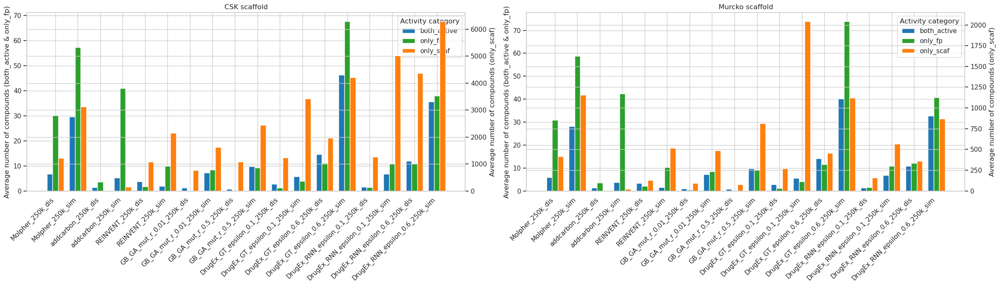

In [35]:
plot_2_plots_with_dual_axis()

# Plots

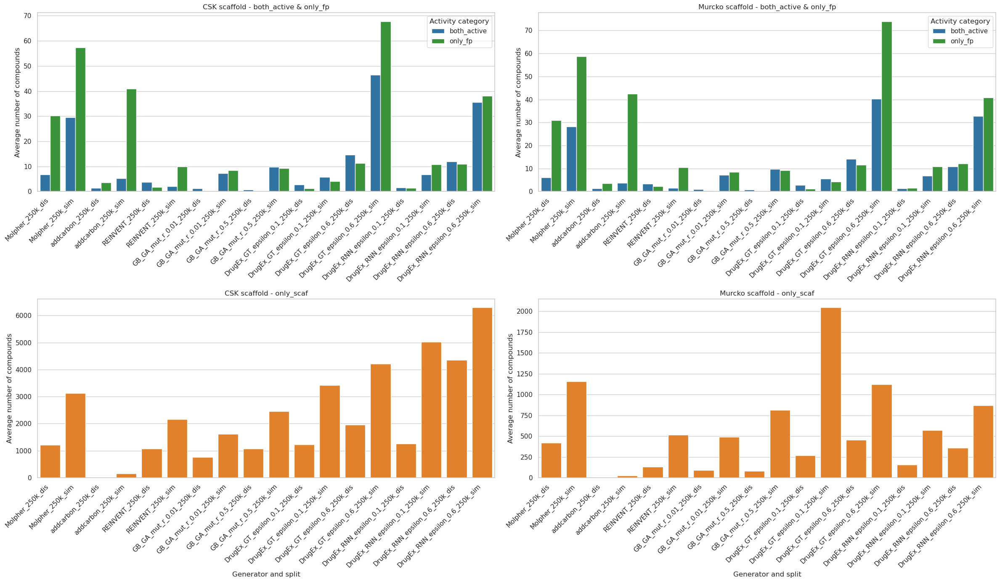

In [98]:
plot_4_plots_side_by_side()

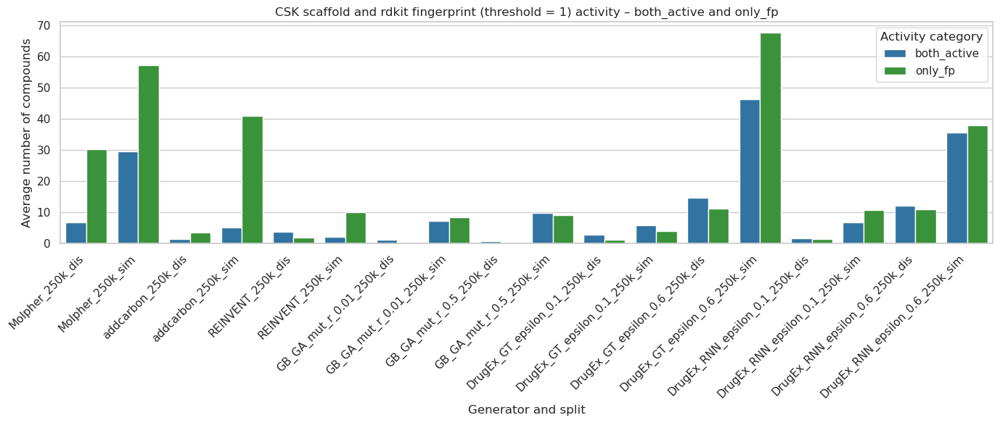

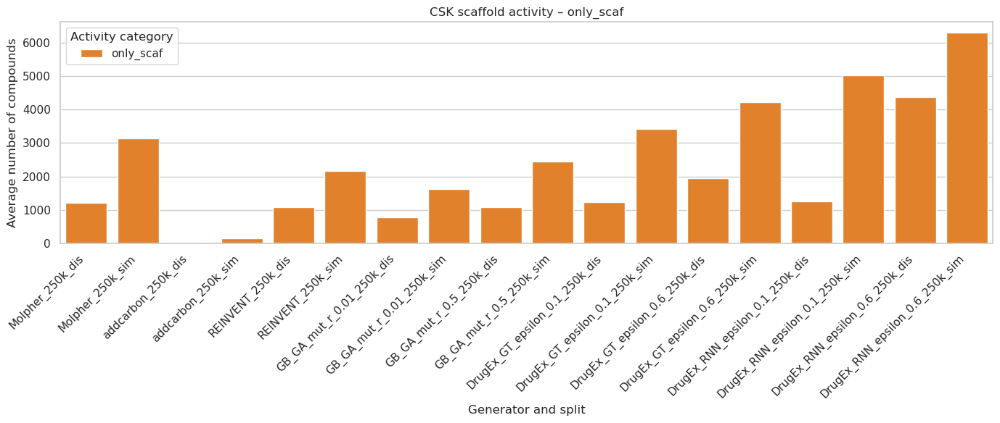

In [10]:
plot_res_scaf_vs_fp_1('csk')

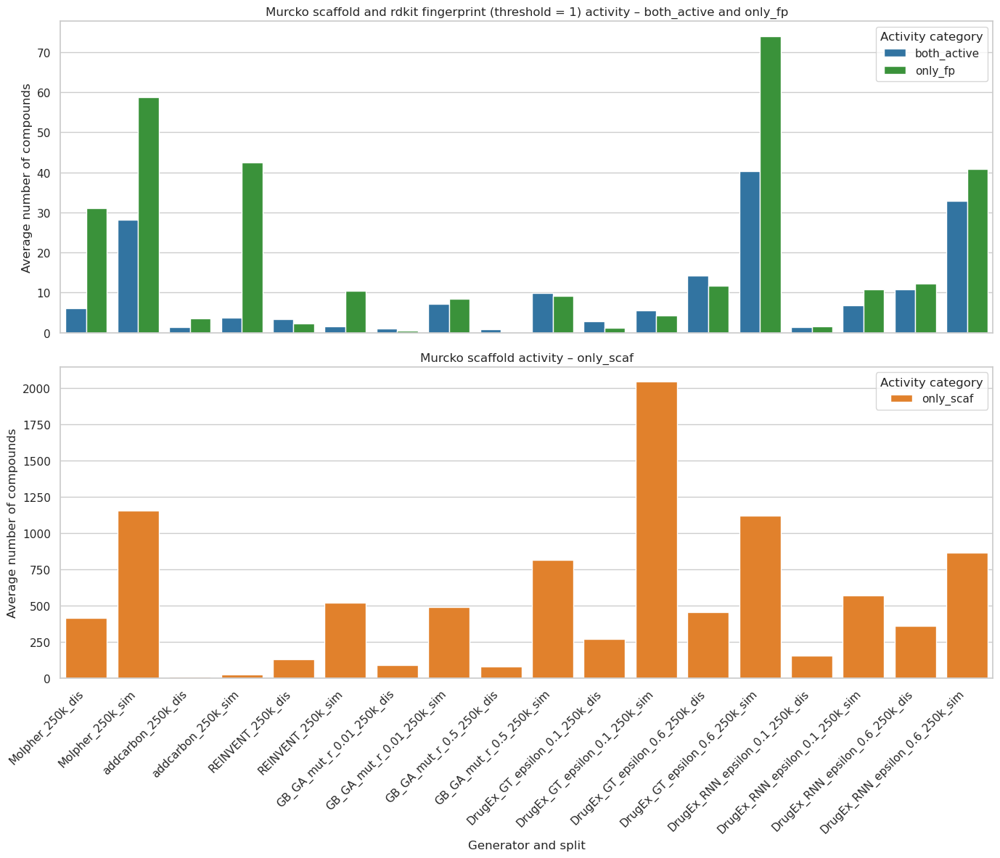

In [11]:
plot_res_scaf_vs_fp('murcko')

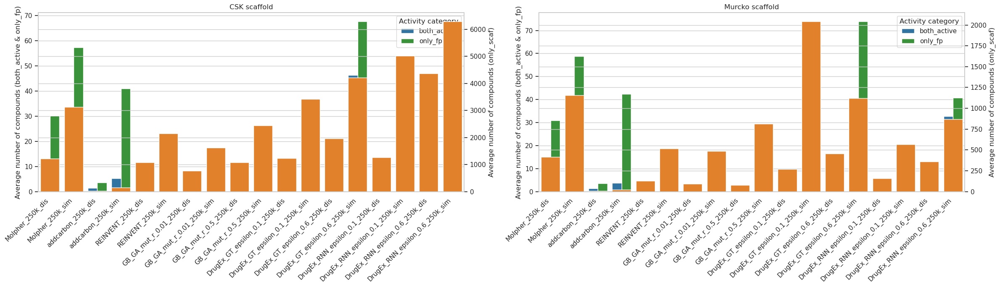

In [21]:
plot_2_plots_with_dual_axis()

# Trends functions

In [12]:
# Cesta ke složce, kde začíná receptor
base_dir = "../../cluster/calculate_metrics/results_1"

# Výstupní DataFrame
results = []

# Pro všechny soubory (rekurzivně)
for file in glob(f"{base_dir}/**/metrics_cluster_*_threshold_*.csv", recursive=True):
    parts = file.split(os.sep)
    receptor = parts[-3]
    generator = parts[-2]

    # Extrahovat split a threshold z názvu souboru
    filename = os.path.basename(file)
    split = filename.split("_")[3]
    threshold = float(filename.split("_threshold_")[1].replace(".csv", ""))

    # Načíst
    df = pd.read_csv(file)

    # Přidat metadata
    df['receptor'] = receptor
    df['generator'] = generator
    df['split'] = split
    df['threshold'] = threshold

    results.append(df)

    
for file in glob(f"data/results_phram_fp/*/rdkit/**/metrics_cluster_*.csv", recursive=True):
    parts = file.split(os.sep)
    receptor = parts[2]
    generator = parts[-2]

    # Extrahovat split a threshold z názvu souboru
    filename = os.path.basename(file)
    split = filename.split("_")[3]
    threshold = 1

    # Načíst
    df = pd.read_csv(file)

    # Přidat metadata
    df['receptor'] = receptor
    df['generator'] = generator
    df['split'] = split
    df['threshold'] = threshold

    results.append(df)

# Spojit všechno do jednoho DataFrame
all_df = pd.concat(results)
all_df.to_csv('analyze_metrics/all_df_thresholds.csv', index = False)
# Průměrovat přes foldy
mean_df = all_df.groupby(['receptor', 'generator', 'split', 'threshold'])[['TUPOR', 'ASER', 'SESY']].mean().reset_index()
mean_df.to_csv('analyze_metrics/mean_df_thresholds.csv', index = False)

In [13]:
mean_df.sort_values(by=['ASER'], ascending=False)

,receptor,generator,split,threshold,TUPOR,ASER,SESY
343,Leukocyte_elastase,REINVENT_250k,sim,0.50,0.667461,8.432721e+00,0.643217
365,Leukocyte_elastase,addcarbon_250k,sim,0.50,0.908973,7.261979e+00,0.037266
366,Leukocyte_elastase,addcarbon_250k,sim,0.55,0.855561,5.105869e+00,0.037266
354,Leukocyte_elastase,addcarbon_250k,dis,0.50,0.654325,4.885727e+00,0.036807
344,Leukocyte_elastase,REINVENT_250k,sim,0.55,0.581577,4.448163e+00,0.643217
...,...,...,...,...,...,...,...
296,Leukocyte_elastase,GB_GA_mut_r_0.5_250k,dis,0.90,0.001695,8.000000e-07,0.521935
297,Leukocyte_elastase,GB_GA_mut_r_0.5_250k,dis,0.95,0.001695,8.000000e-07,0.521935
298,Leukocyte_elastase,GB_GA_mut_r_0.5_250k,dis,1.00,0.000000,0.000000e+00,0.521935
275,Leukocyte_elastase,GB_GA_mut_r_0.01_250k,dis,0.95,0.000000,0.000000e+00,0.500575


In [14]:
def treands_fuc(receptor, mean_df):
    data_rec = mean_df[mean_df.receptor == receptor]
    
    sns.set(style="whitegrid")
    
    metrics = ['TUPOR', 'ASER', 'SESY']
    for metric in metrics:
        g = sns.relplot(
            data=data_rec,
            x='threshold',
            y=metric,
            hue='generator',
            kind='line',
            col='split',
            errorbar=None,
            facet_kws={'sharey': False, 'sharex': True},
            height=5,
            aspect=1.4
        )
    
        for ax in g.axes.flat:
            for line in ax.lines:
                line.set_linewidth(2.5) 
                
        g.set_axis_labels("Threshold", f"Mean {metric}")
        g.set_titles(col_template="{col_name} split")
        g.fig.suptitle(f"Trend of {metric} across thresholds for {receptor}", fontsize=16)
        
        # Posunout legendu mimo graf napravo
        g.fig.subplots_adjust(right=0.88)
        g.fig.subplots_adjust(top=0.88)
        g._legend.set_bbox_to_anchor((1.95, 0.5))
        g._legend.set_title('Generator')
        
        plt.savefig(f"analyze_metrics/trend_{metric}.png", dpi=500, bbox_inches='tight')
        plt.show()

# Trends plots

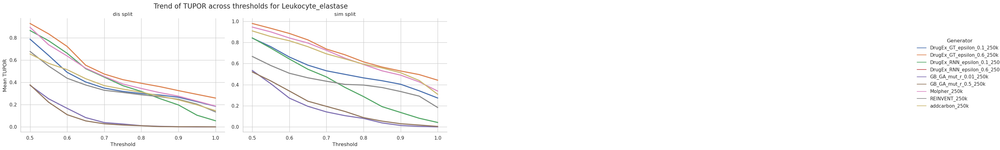

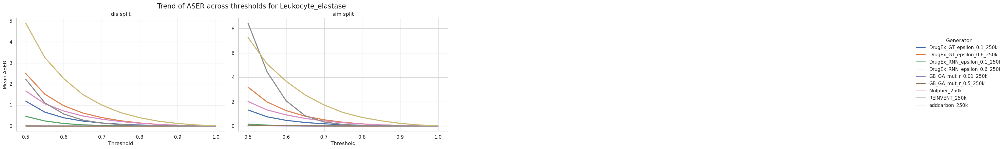

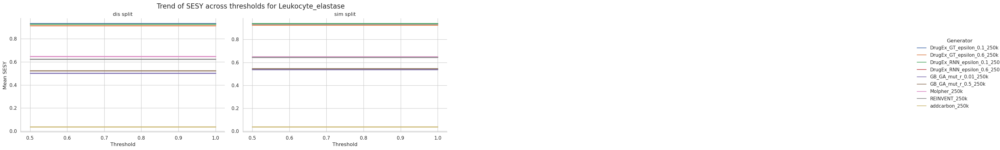

In [15]:
treands_fuc('Leukocyte_elastase', mean_df)

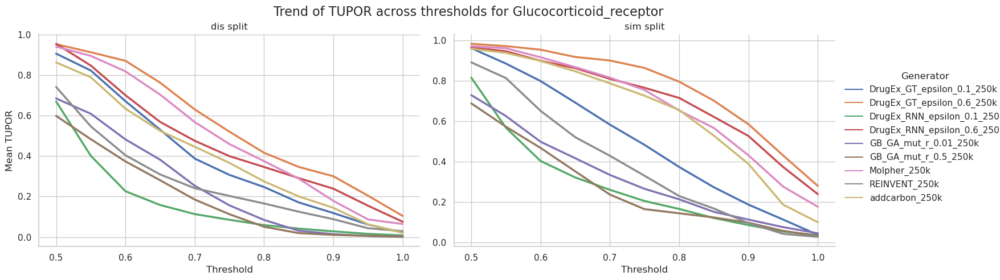

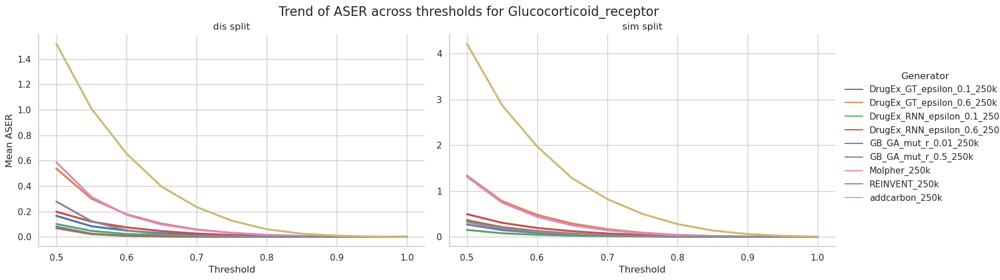

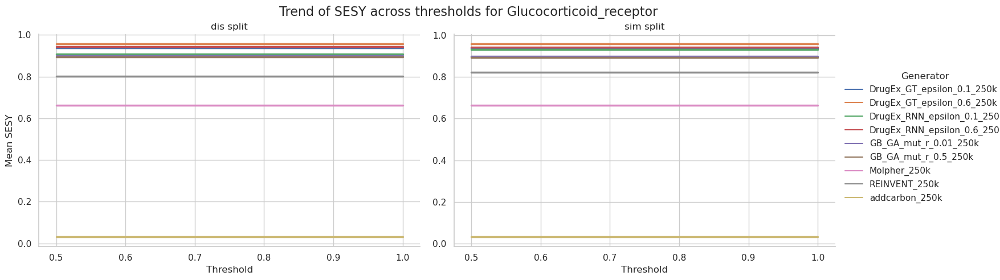

In [195]:
treands_fuc('Glucocorticoid_receptor', mean_df)

# Vizualization and compare compounds with active fp, but non-active scaf. And look for their scaf

In [223]:
df = pd.read_csv('analyze_metrics/merged_df_addcarbon_250k_csk_dis_0.csv')
df[(df.active_fp == 1) & (df.active_scaf==0)]

,smiles,active_scaf,active_fp,activity_category
988,COc1cccc2c1-c1ccc3c(c1C(CC1C=CCCC1)O2)C(C)=CC(...,0,1,only_fp
2247,COc1cccc2c1-c1ccc3c(c1C(CC1C=CCC1)O2)C(C)=CC(C...,0,1,only_fp
6822,CCNC(=O)O[C@@H]1[C@@H](C)c2c(cc(F)c(-c3cccc4c(...,0,1,only_fp
8367,COc1cccc2c1-c1ccc3c(c1C(C1C=CCCC1C)O2)C(C)=CC(...,0,1,only_fp
10885,COc1cccc2c1-c1ccc3c(c1C(C1C=CCC1C)O2)C(C)=CC(C...,0,1,only_fp


In [257]:
# Parametry
generators = ['DrugEx_GT_epsilon_0.6_250k', 'Molpher_250k']
splits = ['sim']
numbers = range(1)
data_dir = 'analyze_metrics'  # uprav podle skutečné cesty

records = []

# Načtení a zpracování všech kombinací
for gen in generators:
    for split in splits:
        for num in numbers:
            file_name = f"merged_df_addcarbon_250k_csk_{split}_{num}.csv"
            file_path = os.path.join(data_dir, file_name)

            if not os.path.exists(file_path):
                print(f"Soubor nenalezen: {file_path}")
                continue

            df = pd.read_csv(file_path)
            df = df[df['activity_category'] == 'only_fp'].copy()
            df['scaffold'] = df['smiles'].apply(
                lambda smi: MurckoScaffoldSmiles(Chem.MolToSmiles(MakeScaffoldGeneric(Chem.MolFromSmiles(smi)))) if Chem.MolFromSmiles(smi) else None
            )
            df.dropna(subset=['scaffold'], inplace=True)

            for scaf in df['scaffold']:
                mol = Chem.MolFromSmiles(scaf)
                if mol:
                    fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius=3, nBits=4096)
                    records.append({
                        'generator': gen,
                        'split': split,
                        'number': num,
                        'scaffold': scaf,
                        'fp': list(fp)
                    })

# Tvorba dataframe
fp_df = pd.DataFrame(records)
fp_matrix = pd.DataFrame(fp_df['fp'].tolist())

fp_df

,generator,split,number,scaffold,fp
0,DrugEx_GT_epsilon_0.6_250k,sim,0,C1CCC(C2CCC(C3CC4CCCC4C4CCCC5CCCCC5C34)CC2)CC1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,DrugEx_GT_epsilon_0.6_250k,sim,0,C1CCC(CCC(CC2CC3CCCCC3C2)C2CCC2)CC1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,DrugEx_GT_epsilon_0.6_250k,sim,0,C1CCC2CCC3C4CCC(CCCC5CCCC5)C4CCC3C2CC1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,DrugEx_GT_epsilon_0.6_250k,sim,0,C1CCC(CCC2(CCCC3CCC4CCCCC4C3)CCCC3C4CCC5CCCCC5...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,DrugEx_GT_epsilon_0.6_250k,sim,0,C1CCC(C2CC3C(CCC4CC4)CCC3C3CCC4CCCCCC4C23)CC1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...,...,...
73,Molpher_250k,sim,0,C1CCC(C2CC3C(CCC4CCC4)CCC3C3CCC4CCCCC4C23)CC1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
74,Molpher_250k,sim,0,C1CCC(C2CCC(C3CC4CCCCC4C4CCC5CCCCC5C34)CC2)CC1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
75,Molpher_250k,sim,0,C1CCC(C2CCC(C3CC4CCCC4C4CCC5CCCCCC5C34)CC2)CC1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
76,Molpher_250k,sim,0,C1CCC(C2CCC(C3CC4CCCC4C4CCCC5CCCCC5C34)CC2)CC1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


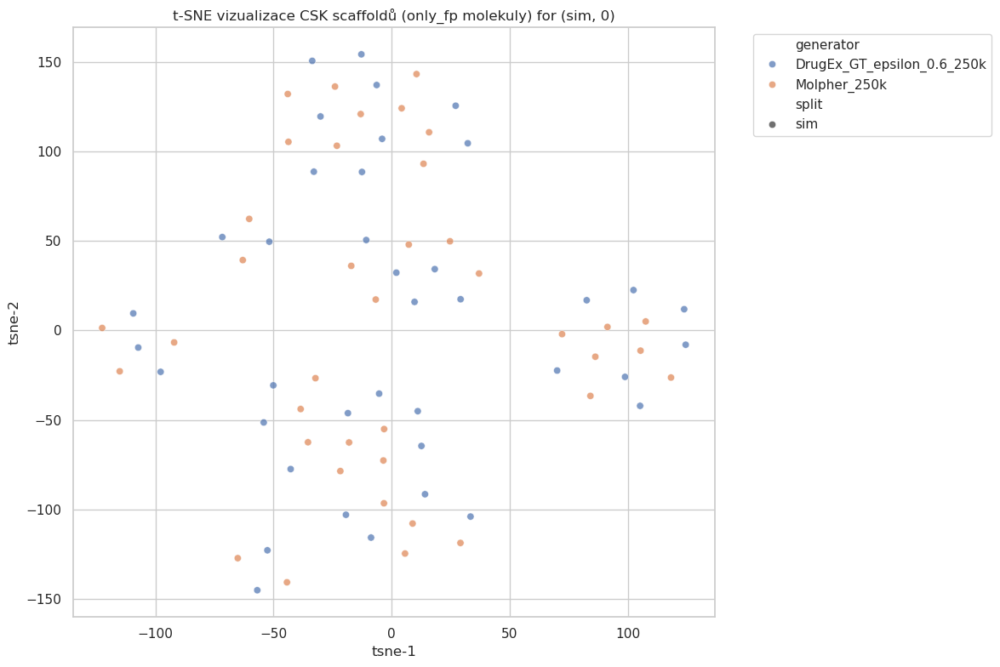

In [240]:
# t-SNE redukce

for splits in ['sim']:
    for number in range(1):

        fp_df_ = fp_df[(fp_df.split == split) & (fp_df.number == number)]
        fp_matrix = pd.DataFrame(fp_df_['fp'].tolist())
        tsne = TSNE(n_components=2, random_state=42, perplexity=30)
        embedding = tsne.fit_transform(fp_matrix)
    
        fp_df_['tsne-1'] = embedding[:, 0]
        fp_df_['tsne-2'] = embedding[:, 1]

        # Vizualizace
        plt.figure(figsize=(12, 8))
        sns.scatterplot(
            data=fp_df_,
            x='tsne-1',
            y='tsne-2',
            hue='generator',
            style='split',
            alpha=0.7
        )
        plt.title(f"t-SNE vizualizace CSK scaffoldů (only_fp molekuly) for ({splits}, {number})")
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


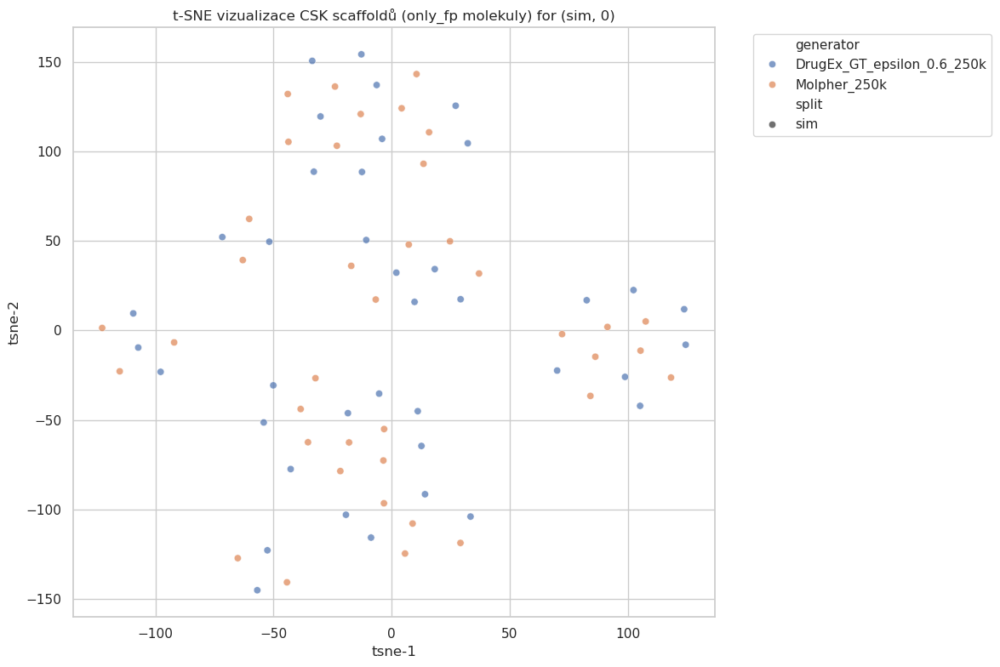

In [244]:
# Převedeme scaffold na PIL Image a pak na base64 string
def mol_to_base64_img(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    img = Draw.MolToImage(mol, size=(200, 200))
    buffer = BytesIO()
    img.save(buffer, format="PNG")
    encoded = base64.b64encode(buffer.getvalue()).decode("utf-8")
    return f"<img src='data:image/png;base64,{encoded}'>"

# Výběr dat pro jeden split a number
split = 'sim'
number = 0

fp_df_ = fp_df[(fp_df.split == split) & (fp_df.number == number)].copy()
fp_matrix = pd.DataFrame(fp_df_['fp'].tolist())
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
embedding = tsne.fit_transform(fp_matrix)

fp_df_['tsne-1'] = embedding[:, 0]
fp_df_['tsne-2'] = embedding[:, 1]

# Vizualizace
fig, ax = plt.subplots(figsize=(12, 8))
scatter = sns.scatterplot(
    data=fp_df_,
    x='tsne-1',
    y='tsne-2',
    hue='generator',
    style='split',
    alpha=0.7,
    ax=ax
)
plt.title(f"t-SNE vizualizace CSK scaffoldů (only_fp molekuly) for ({split}, {number})")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Připravíme si seznam obrázků ve formátu HTML img tagů
tooltips = [mol_to_base64_img(smiles) for smiles in fp_df_['scaffold']]

# Přidání interaktivních tooltipů
cursor = mplcursors.cursor(scatter.collections[0], hover=True)

@cursor.connect("add")
def on_add(sel):
    index = sel.index
    sel.annotation.set(text=tooltips[index], anncoords="offset points")
    sel.annotation.set_bbox(dict(boxstyle="round", facecolor="white", alpha=0.9))
    sel.annotation.set_text(tooltips[index])  # bude to HTML string s obrázkem

plt.show()

In [330]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import Draw
from io import BytesIO
import base64
from sklearn.manifold import TSNE
import plotly.graph_objects as go

# Převod SMILES na base64 obrázek
def smiles_to_base64(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return ""
    img = Draw.MolToImage(mol, size=(200, 200))
    buffer = BytesIO()
    img.save(buffer, format="PNG")
    img_str = base64.b64encode(buffer.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{img_str}"

# Výběr dat
split = 'sim'
number = 0
fp_df_ = fp_df[(fp_df.split == split) & (fp_df.number == number)].copy()
fp_matrix = pd.DataFrame(fp_df_['fp'].tolist())

# Redukce
tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(fp_df_) // 3))
embedding = tsne.fit_transform(fp_matrix)
fp_df_['tsne-1'] = embedding[:, 0]
fp_df_['tsne-2'] = embedding[:, 1]

# Scaffold obrázky jako base64
fp_df_['img_base64'] = fp_df_['scaffold'].apply(smiles_to_base64)

# Barevná paleta pro generátory
generator_colors = {
    "DrugEx": "red",
    "REINVENT": "blue",
    "Molpher": "green",
    # přidej další podle potřeby
}

# Marker styly pro splity
split_markers = {
    "sim": "circle",
    "dis": "square"
}

# Vytvoření trace
fig = go.Figure()
print(fp_df_)
for gen in fp_df_['generator'].unique():
    for spl in fp_df_['split'].unique():
        subset =  fp_df_[(fp_df_['generator'] == gen) & (fp_df_['split'] == spl)]
    
        fig.add_trace(go.Scatter(
            x=subset['tsne-1'],
            y=subset['tsne-2'],
            mode='markers',
            name=gen,
            marker=dict(size=8, opacity=0.7),
            customdata=subset[['img_base64']],
            hovertemplate=(
            "<img src='img/similarity_split.jpg'>"
            ),
            
        ))

fig.update_layout(
    title=f"t-SNE vizualizace CSK scaffoldů (only_fp) – split: {split}, number: {number}",
    height=800,
    width=1000,
    hoverlabel=dict(bgcolor="white")
)

fig.show()


/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



                     generator split  number  \
0   DrugEx_GT_epsilon_0.6_250k   sim       0   
1   DrugEx_GT_epsilon_0.6_250k   sim       0   
2   DrugEx_GT_epsilon_0.6_250k   sim       0   
3   DrugEx_GT_epsilon_0.6_250k   sim       0   
4   DrugEx_GT_epsilon_0.6_250k   sim       0   
..                         ...   ...     ...   
73                Molpher_250k   sim       0   
74                Molpher_250k   sim       0   
75                Molpher_250k   sim       0   
76                Molpher_250k   sim       0   
77                Molpher_250k   sim       0   

                                             scaffold  \
0      C1CCC(C2CCC(C3CC4CCCC4C4CCCC5CCCCC5C34)CC2)CC1   
1                 C1CCC(CCC(CC2CC3CCCCC3C2)C2CCC2)CC1   
2              C1CCC2CCC3C4CCC(CCCC5CCCC5)C4CCC3C2CC1   
3   C1CCC(CCC2(CCCC3CCC4CCCCC4C3)CCCC3C4CCC5CCCCC5...   
4       C1CCC(C2CC3C(CCC4CC4)CCC3C3CCC4CCCCCC4C23)CC1   
..                                                ...   
73      C1CCC(C2CC3C(CCC

In [359]:
print(fp_df_[fp_df_['generator'] == 'DrugEx_GT_epsilon_0.6_250k'])

                     generator split  number  \
0   DrugEx_GT_epsilon_0.6_250k   sim       0   
1   DrugEx_GT_epsilon_0.6_250k   sim       0   
2   DrugEx_GT_epsilon_0.6_250k   sim       0   
3   DrugEx_GT_epsilon_0.6_250k   sim       0   
4   DrugEx_GT_epsilon_0.6_250k   sim       0   
5   DrugEx_GT_epsilon_0.6_250k   sim       0   
6   DrugEx_GT_epsilon_0.6_250k   sim       0   
7   DrugEx_GT_epsilon_0.6_250k   sim       0   
8   DrugEx_GT_epsilon_0.6_250k   sim       0   
9   DrugEx_GT_epsilon_0.6_250k   sim       0   
10  DrugEx_GT_epsilon_0.6_250k   sim       0   
11  DrugEx_GT_epsilon_0.6_250k   sim       0   
12  DrugEx_GT_epsilon_0.6_250k   sim       0   
13  DrugEx_GT_epsilon_0.6_250k   sim       0   
14  DrugEx_GT_epsilon_0.6_250k   sim       0   
15  DrugEx_GT_epsilon_0.6_250k   sim       0   
16  DrugEx_GT_epsilon_0.6_250k   sim       0   
17  DrugEx_GT_epsilon_0.6_250k   sim       0   
18  DrugEx_GT_epsilon_0.6_250k   sim       0   
19  DrugEx_GT_epsilon_0.6_250k   sim    

[['',
  'C1CCC(C2CCC(C3CC4CCCC4C4CCCC5CCCCC5C34)CC2)CC1',
  'Molpher_250k'],
 ['',
  'C1CCC(CCC(CC2CC3CCCCC3C2)C2CCC2)CC1',
  'Molpher_250k'],
 ['',
  'C1CCC2CCC3C4CCC(CCCC5CCCC5)C4CCC3C2CC1',
  'Molpher_250k'],
 ['',
  'C1CCC(CCC2(CCCC3CCC4CCCCC4C3)CCCC3C4CCC5CCCCC5C4CCC32)C1',
  'Molpher_250k'],
 ['',
  'C1CCC(C2CC3C(CCC4CC4)CCC3C3CCC4CCCCCC4C23)CC1',
  'Molpher_250k'],
 ['',
  'C1CCCC(CCCC2CCC3C2CCC2C4CCCCC4CCC32)CC1',
  'Molpher_250k'],
 ['',
  'C1CCC(C(CCCC2CCC2)CC2CCC3C(CCC3C3CCCCC3)C2)CC1',
  'Molpher_250k'],
 ['',
  'C1CCC(CCC(CC2CC3CCCCC3C2)C2CC2)CC1',
  'Molpher_250k'],
 ['',
  'C1CCC(CCCC2CCC3C2CCC2C4CCCCCC4CCC32)CC1',
  'Molpher_250k'],
 ['',
  'C1CCC(C2CC3C(CCC4CC4)CCC3C3CCCC4CCCCC4C23)CC1',
  'Molpher_250k'],
 ['',
  'C1CCC(C(CCCC2CCC2)CC2CCC3C(CCC3C3CCCCC3)C2)CC1',
  'Molpher_250k'],
 ['',
  'C1CCCC(C2CCC(C3CC4CCCC4C4CCC5CCCCC5C34)CC2)CC1',
  'Molpher_250k'],
 ['',
  'C1CCC2CCC3C4CCC(CCCC5CCC6CCCCC6C5)C4CCC3C2CC1',
  'Molpher_250k'],
 ['',
  'C1CCC(C2CC3C(CCC4CC4)CCC3C3C
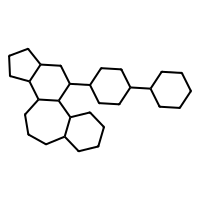
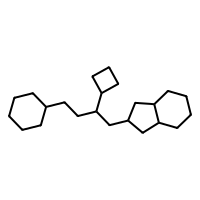
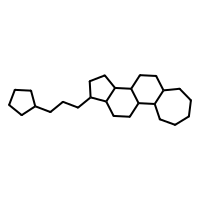
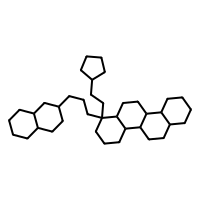
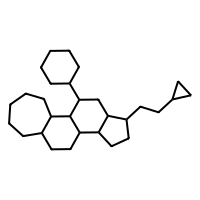
...
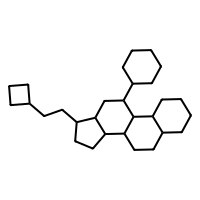
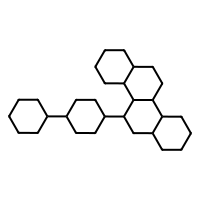
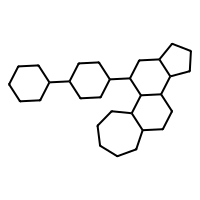
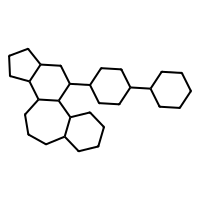
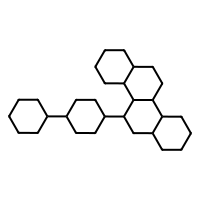

In [358]:
customdata

In [375]:
import plotly.graph_objects as go
from IPython.display import display, HTML
from ipywidgets import Output

out = Output()
display(out)

# Převod generátoru na barvu pro každý bod
colors = fp_df_['generator'].map(generator_colors).tolist()

# Převod splitu na symbol pro každý bod
symbols_map = {'sim': 'circle', 'dis': 'square'}
symbols = fp_df_['split'].map(symbols_map).tolist()

customdata = fp_df_[['img_base64', 'scaffold', 'generator', 'split']].values.tolist()

fig = go.FigureWidget()

fig.add_trace(go.Scatter(
    x=fp_df_['tsne-1'],
    y=fp_df_['tsne-2'],
    mode='markers',
    marker=dict(
        size=10,
        color=colors,
        symbol=symbols,
        opacity=0.7,
        line=dict(width=1, color='DarkSlateGrey')
    ),
    customdata=customdata,
    hovertemplate=" "  # necháme prázdné hover
))

def on_point_click(trace, points, state):
    with out:
        out.clear_output()
        if points.point_inds:
            idx = points.point_inds[0]
            img_src, scaffold, generator, split_val = trace.customdata[idx]
            html = (
                f"<b>SMILES:</b> {scaffold}<br>"
                f"<b>Generator:</b> {generator}<br>"
                f"<b>Split:</b> {split_val}<br><br>"
                f"<img src='{img_src}' width='150' height='150'>"
            )
            display(HTML(html))

fig.data[0].on_click(on_point_click)

# **Ručně vytvořená legenda**
# Pro každý generátor a split přidáme "neviditelné" trace pro legendu
for gen, color in generator_colors.items():
    for split_val, symbol in split_markers.items():
        fig.add_trace(go.Scatter(
            x=[None], y=[None],
            mode='markers',
            marker=dict(size=10, color=color, symbol=symbol),
            legendgroup=f"{gen}_{split_val}",
            showlegend=True,
            name=f"{gen} ({split_val})"
        ))

fig.show()


Output()

FigureWidget({
    'data': [{'customdata': [['data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAMgAA
                             ADICAIAAAAiOjnJAAAY0klEQVR4nO3daVhU1xkH8HcWhk0jCC7gwhZ
                             FkUjJaNSAQMjErRCCDSZVYnEbTRqntZElKhBsjJNYG1JNC43REM2jR
                             R5MsOIyIhKIoWFaIwrKniBYAWVfZpitH04zDw8wwzD3nEuA8/tkZea
                             9x+bPe2fuPedcjk6nA4rCjTvSA6DGJhosiggaLIoIGiyKCBosiggaL
                             IoIGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiy
                             KCBosiggaLIoIGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiyKCBosi
                             ggaLIoIGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiyKCBosiggaLIo
                             IGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiyKC
                             PzBqqmp0Wg02MtSowu2YCkUirNnzz7//PPu7u4TJ06UyWS4KlOjEYf
                             hgzB1Ol1BQcGJEycyMjI6OjoAgMPh6HS6efPmfffddxMnTsQ0Tmq00
                             Zmrrq5OKpU++eST+lJCoTA5Obm8vNzb2x

# Tady jsem skoncila!!!!

In [405]:
import plotly.graph_objects as go
from IPython.display import display, HTML
from ipywidgets import Output

def plot_fp_tsne(df):
    out = Output()
    display(out)

    fp_df_ = fp_df[(fp_df.split == split) & (fp_df.number == number)].copy()
    fp_matrix = pd.DataFrame(fp_df_['fp'].tolist())

    # Redukce
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(fp_df_) // 3))
    embedding = tsne.fit_transform(fp_matrix)
    fp_df_['tsne-1'] = embedding[:, 0]
    fp_df_['tsne-2'] = embedding[:, 1]

    # Scaffold obrázky jako base64
    fp_df_['img_base64'] = fp_df_['scaffold'].apply(smiles_to_base64)

    generator_colors = {
    "DrugEx_GT_epsilon_0.6_250k": "red",
    "REINVENT": "blue",
    "Molpher_250k": "green",
    # přidej další podle potřeby
    }

    # Marker styly pro splity
    split_markers = {
        "sim": "circle",
        "dis": "square"
    }

    # Barvy a symboly podle df
    colors = df['generator'].map(generator_colors).tolist()
    symbols = df['split'].map(split_markers).tolist()

    customdata = df[['img_base64', 'scaffold', 'generator', 'split']].values.tolist()

    fig = go.FigureWidget()

    # Hlavní trace s body, ale bez legendy
    fig.add_trace(go.Scatter(
        x=df['tsne-1'],
        y=df['tsne-2'],
        mode='markers',
        marker=dict(
            size=10,
            color=colors,
            symbol=symbols,
            opacity=0.7,
            line=dict(width=1, color='DarkSlateGrey')
        ),
        customdata = customdata,
        hovertemplate=" ",  # generator jako hover text
        name=' ',  # název v legendě
        showlegend=False,
    ))

    # Callback na kliknutí
    def on_point_click(trace, points, state):
        with out:
            out.clear_output()
            if points.point_inds:
                idx = points.point_inds[0]
                img_src, scaffold, generator, split_val = trace.customdata[idx]
                html = (
                    f"<b>SMILES:</b> {scaffold}<br>"
                    f"<b>Generator:</b> {generator}<br>"
                    f"<b>Split:</b> {split_val}<br><br>"
                    f"<img src='{img_src}' width='150' height='150'>"
                )
                display(HTML(html))

    fig.data[0].on_click(on_point_click)

    # Dummy trace pro legendu (barevná i tvarová kombinace)
    for gen, color in generator_colors.items():
        for split_val, symbol in split_markers.items():
            fig.add_trace(go.Scatter(
                x=[None], y=[None],
                mode='markers',
                marker=dict(size=12, color=color, symbol=symbol),
                legendgroup=f"{gen}_{split_val}",
                showlegend=True,
                name=f"{gen} ({split_val})"
            ))

    # Zvýšení velikosti grafu
    fig.update_layout(
        width=900,
        height=700,
        title="t-SNE plot with scaffolds",
        legend_title="Generator (Split)",
        legend=dict(itemsizing='constant')
    )

    return fig, out


In [407]:
fig, out = plot_fp_tsne(fp_df)
fig.show()

Output()

KeyError: "['img_base64'] not in index"

"<h4>Molpher_250k — Scaffold</h4><p>C1CCC(CCC2(CCCC3CCC4CCCCC4C3)CCCC3C4CCC5CCCCC5C4CCC32)C1</p>"
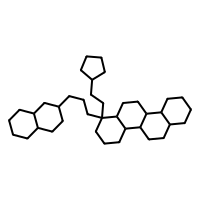

FigureWidget({
    'data': [{'customdata': [['data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAMgAA
                             ADICAIAAAAiOjnJAAAY0klEQVR4nO3daVhU1xkH8HcWhk0jCC7gwhZ
                             FkUjJaNSAQMjErRCCDSZVYnEbTRqntZElKhBsjJNYG1JNC43REM2jR
                             R5MsOIyIhKIoWFaIwrKniBYAWVfZpitH04zDw8wwzD3nEuA8/tkZea
                             9x+bPe2fuPedcjk6nA4rCjTvSA6DGJhosiggaLIoIGiyKCBosiggaL
                             IoIGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiy
                             KCBosiggaLIoIGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiyKCBosi
                             ggaLIoIGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiyKCBosiggaLIo
                             IGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiyKCBosiggaLIoIGiyKC
                             PzBqqmp0Wg02MtSowu2YCkUirNnzz7//PPu7u4TJ06UyWS4KlOjEYf
                             hgzB1Ol1BQcGJEycyMjI6OjoAgMPh6HS6efPmfffddxMnTsQ0Tmq00
                             Zmrrq5OKpU++eST+lJCoTA5Obm8vNzb2x

In [368]:
import plotly.graph_objects as go

# Předpoklad: fp_df_ obsahuje všechny generátory a potřebné sloupce tsne-1, tsne-2, img_base64, generator

fig = go.FigureWidget()

fig.add_trace(go.Scatter(
    x=fp_df_['tsne-1'],
    y=fp_df_['tsne-2'],
    mode='markers',
    marker=dict(size=15, color=fp_df_['generator'].map(generator_colors)),
    customdata=fp_df_[['img_base64', 'generator', 'scaffold']].values.tolist(),
    hovertemplate="%{customdata[1]}<br>Scaffold: %{customdata[2]}"
))

out = display(display_id=True)

def on_point_click(trace, points, state):
    if points.point_inds:
        idx = points.point_inds[0]
        img_src, gen, scaffold = fp_df_.iloc[idx][['img_base64', 'generator', 'scaffold']]
        html_img = f"<h4>{gen} — Scaffold</h4><img src='{img_src}' width='150' height='150'><p>{scaffold}</p>"
        out.update(html_img)

fig.data[0].on_click(on_point_click)

fig.show()


"<h4>ethanol</h4>"
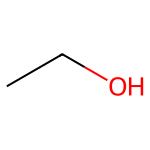

FigureWidget({
    'data': [{'customdata': [['data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAJYAA
                             ACWCAIAAACzY+a1AAAITklEQVR4nO2bXUxTdxTAT6GlpSIUUJBANkC
                             gKs4NF/nIAnOIxkAfho4sMWlIlqwzZmv2sjSbD41bwro9bPWRZC/1y
                             bC4ZB2MJfjJAyhKHUY+jbqJQwQBA1KgfJw93LuiWMrXbe898/zSh9t
                             7z/3/T++v/3tv/6dXhYjAUCZC7gSYjcIKycMKycMKycMKycMKycMKy
                             cMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycM
                             KycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKy
                             cMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycM
                             KycMKycMKycMKycMKyUNSodfrPXbsWGVlZW1trdy5KACkhsPh0Gq1/
                             vxNJtP9+/flTkpOKCns6+szmUyCOY1GYzQadTodAOj1+lOnTnm9Xrk
                             TlAcaCp89e2a324XBp9frDx48OD4+joj9/f1ms1mlUgFAamqqy+VaW
                             FiQO9lwo3SF8/PzLpcrOTkZAFQqldlsfv

In [332]:
import plotly.graph_objects as go
from rdkit import Chem
from rdkit.Chem import Draw
from IPython.display import display
from io import BytesIO
import base64
import pandas as pd

# Data
data = {
    "SMILES": ["CCO", "CC", "CCC"],
    "tsne-1": [1, 2, 3],
    "tsne-2": [4, 5, 6],
    "NAME": ["ethanol", "ethane", "propane"]
}
df = pd.DataFrame(data)

def mol_to_base64_png(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    img = Draw.MolToImage(mol, size=(150,150))
    buffer = BytesIO()
    img.save(buffer, format="PNG")
    img_str = base64.b64encode(buffer.getvalue()).decode()
    return f"data:image/png;base64,{img_str}"

df['img_base64'] = df['SMILES'].apply(mol_to_base64_png)

fig = go.FigureWidget(data=[
    go.Scatter(
        x=df['tsne-1'],
        y=df['tsne-2'],
        mode='markers',
        marker=dict(size=15, color='blue'),
        customdata=df[['img_base64', 'NAME']].values.tolist(),
        hovertemplate="%{customdata[1]}"  # jen název
    )
])

# Výstupní widget pro obrázek
out = display(display_id=True)

def on_point_click(trace, points, state):
    print("cklik")
    if points.point_inds:
        idx = points.point_inds[0]
        img_src = df.iloc[idx]['img_base64']
        name = df.iloc[idx]['NAME']
        html_img = f"<h4>{name}</h4><img src='{img_src}' width='150' height='150'>"
        out.update(html_img)

fig.data[0].on_click(on_point_click)

fig.show()


In [335]:
import plotly.graph_objects as go
from rdkit import Chem
from rdkit.Chem import Draw
from IPython.display import display
from ipywidgets import Output
from io import BytesIO
import base64
import pandas as pd
from IPython.display import HTML, display

# Data
data = {
    "SMILES": ["CCO", "CC", "CCC"],
    "tsne-1": [1, 2, 3],
    "tsne-2": [4, 5, 6],
    "NAME": ["ethanol", "ethane", "propane"]
}
df = pd.DataFrame(data)

def mol_to_base64_png(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    img = Draw.MolToImage(mol, size=(150,150))
    buffer = BytesIO()
    img.save(buffer, format="PNG")
    img_str = base64.b64encode(buffer.getvalue()).decode()
    return f"data:image/png;base64,{img_str}"

df['img_base64'] = df['SMILES'].apply(mol_to_base64_png)

fig = go.FigureWidget(data=[
    go.Scatter(
        x=df['tsne-1'],
        y=df['tsne-2'],
        mode='markers',
        marker=dict(size=15, color='blue'),
        customdata=df[['img_base64', 'NAME']].values.tolist(),
        hovertemplate="%{customdata[1]}"  # jen název
    )
])

# Vytvoříme widget pro výstup (pod graf)
out = Output()

# Zobrazíme výstup widget
display(out)

def on_point_click(trace, points, state):
    with out:
        out.clear_output()  # vyčistí předchozí obsah
        if points.point_inds:
            idx = points.point_inds[0]
            img_src = df.iloc[idx]['img_base64']
            name = df.iloc[idx]['NAME']
            html_img = f"<h4>{name}</h4><img src='{img_src}' width='150' height='150'>"
            display_html = f"<div>{html_img}</div>"


            # Použijeme IPython display přímo
            
            display(HTML(html_img))

fig.data[0].on_click(on_point_click)

fig.show()


Output()

FigureWidget({
    'data': [{'customdata': [['data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAJYAA
                             ACWCAIAAACzY+a1AAAITklEQVR4nO2bXUxTdxTAT6GlpSIUUJBANkC
                             gKs4NF/nIAnOIxkAfho4sMWlIlqwzZmv2sjSbD41bwro9bPWRZC/1y
                             bC4ZB2MJfjJAyhKHUY+jbqJQwQBA1KgfJw93LuiWMrXbe898/zSh9t
                             7z/3/T++v/3tv/6dXhYjAUCZC7gSYjcIKycMKycMKycMKycMKycMKy
                             cMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycM
                             KycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKy
                             cMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycMKycM
                             KycMKycMKycMKycMKyUNSodfrPXbsWGVlZW1trdy5KACkhsPh0Gq1/
                             vxNJtP9+/flTkpOKCns6+szmUyCOY1GYzQadTodAOj1+lOnTnm9Xrk
                             TlAcaCp89e2a324XBp9frDx48OD4+joj9/f1ms1mlUgFAamqqy+VaW
                             FiQO9lwo3SF8/PzLpcrOTkZAFQqldlsfv

# Bitovy prekryv IS vs RS

In [218]:
def fingerprint_strs_to_array(fp_series):
    return np.array([list(map(int, list(fp))) for fp in fp_series])

def compute_fingerprint_overlap(IS_fps, RS_fps):
    IS_bin = np.array([list(map(int, list(fp))) for fp in IS_fps])
    RS_bin = np.array([list(map(int, list(fp))) for fp in RS_fps])
    
    IS_active = np.any(IS_bin, axis=0)
    RS_active = np.any(RS_bin, axis=0)
    
    intersection = np.logical_and(IS_active, RS_active)
    union = np.logical_or(IS_active, RS_active)
    xor_diff = np.logical_xor(IS_active, RS_active)
    
    n_intersection = np.sum(intersection)
    n_union = np.sum(union)
    n_IS = np.sum(IS_active)
    n_RS = np.sum(RS_active)
    n_diff = np.sum(xor_diff)

    jaccard_similarity = n_intersection / n_union if n_union else 0
    jaccard_distance = n_diff / n_union if n_union else 0

    return {
        "bit_length" : len(IS_active),
        "active_bits_IS": n_IS,
        "active_bits_RS": n_RS,
        "common_bits": n_intersection,
        "union_bits": n_union,
        "diff_bits": n_diff,
        "jaccard_similarity": jaccard_similarity,
        "jaccard_distance": jaccard_distance,
        "percent_common_in_IS": 100 * n_intersection / n_IS if n_IS else 0,
        "percent_common_in_RS": 100 * n_intersection / n_RS if n_RS else 0,
    }

In [219]:
res = []

for receptor in ['Glucocorticoid_receptor', 'Leukocyte_elastase']:
    for split in ['dis', 'sim']:
        for number in [0,1,2,3,4]:
            IS_df = pd.read_csv(f'../../cluster/res_fp_IS/{receptor}/phfp_of_input_set_cluster_{number}_{split}_with_smiles.csv')
            RS_df = pd.read_csv(f'../../cluster/res_fp_IS/{receptor}/phfp_of_recall_set_cluster_{number}_{split}_with_smiles.csv')

            a = compute_fingerprint_overlap(IS_df.fp.tolist(), RS_df.fp.to_list())
            a['receptor'] = receptor
            a['split'] = split
            a['number'] = number
            res.append(a)
results_df = pd.DataFrame(res)
results_df

,bit_length,active_bits_IS,active_bits_RS,common_bits,union_bits,diff_bits,jaccard_similarity,jaccard_distance,percent_common_in_IS,percent_common_in_RS,receptor,split,number
0,7464,1479,1167,1021,1625,604,0.628308,0.371692,69.033130,87.489289,Glucocorticoid_receptor,dis,0
1,7464,1591,1033,999,1625,626,0.614769,0.385231,62.790698,96.708616,Glucocorticoid_receptor,dis,1
2,7464,1520,1187,1082,1625,543,0.665846,0.334154,71.184211,91.154170,Glucocorticoid_receptor,dis,2
3,7464,1575,1038,988,1625,637,0.608000,0.392000,62.730159,95.183044,Glucocorticoid_receptor,dis,3
4,7464,1596,984,955,1625,670,0.587692,0.412308,59.837093,97.052846,Glucocorticoid_receptor,dis,4
5,7464,1368,1447,1190,1625,435,0.732308,0.267692,86.988304,82.239115,Glucocorticoid_receptor,sim,0
6,7464,1592,1203,1170,1625,455,0.720000,0.280000,73.492462,97.256858,Glucocorticoid_receptor,sim,1
7,7464,1590,1063,1028,1625,597,0.632615,0.367385,64.654088,96.707432,Glucocorticoid_receptor,sim,2
8,7464,1617,1091,1083,1625,542,0.666462,0.333538,66.975881,99.266728,Glucocorticoid_receptor,sim,3
9,7464,1594,1052,1021,1625,604,0.628308,0.371692,64.052698,97.053232,Glucocorticoid_receptor,sim,4
